# FX Forecasting

**Plotly graphs may not appear on github, please use nbviewer instead at
https://nbviewer.jupyter.org/github/JonnyFLDN/FX-Forecasting/blob/master/FX%20Forecasting.ipynb


# Table of Contents

1. [Objective](#obj)
    <br>1.1 [Libraries](#lib)
2. [Dataset](#data)
    <br>2.1 [Stationarity test](#st)
    <br>2.2 [Feature engineering](#fe)
    <br>2.3 [Data visualisation](#dv)
3. [Modelling](#mdl)
    <br> 3.1 [Time series cross validation](#tscv)
    <br> 3.2 [Framework](#frm)
4. [Predictions](#prd)
    <br> 4.1 [Linear Regression](#lin)
    <br> 4.2 [Lasso Regression](#lass)
    <br> 4.3 [Decision Tree](#dec)
    <br> 4.4 [Ensemble](#ens)
    <br>&emsp;4.4.1 [Random Forest](#rf)
    <br>&emsp;4.4.2 [Gradient Boosted Trees](#gbt)
    <br> 4.5 [LSTM](#lstm)
5. [Summary](#sum)

    

# <a name="obj"></a> Objective

The aim of this project is to build a variety of machine-learning models to predict out-of-sample currency movements. In particular, we examine whether these models have a better predictive power than a simple historical mean measure.

We will attempt to predict 9 currencies with 4 variables including interest rates, money supply, industrial production and inflation, stemming from 1977 to 2010. Models include: OLS, Lasso, Decision trees, Random Forest, Gradient Boosted Trees and LSTM.  

In order to assess the predictive power of each model against the historical mean, a rolling-window regression technique is used, whereby the model trains of a segment/window of data up to time T and predicts value T+1. At each window, we compute a cumulative RMSE (root mean squared error) for both predictors and compare the out-of-sample R-squared.

The key metrics are as follows:

\begin{eqnarray}
\newline w = window\\
\newline
{y_{pred}}_{t,historical} = \frac {\sum_{i=t-w}^{t-1}{y_i}}{w}\\
\newline
{y_{pred}}_{t,model} = \beta_{t-1}*X_{t}\\
\newline
{MSE}_{t}  = (Y_{{pred}_{t}}-Y_{{true}_{t}})^{2}\\
\newline
{Cumulative RMSE}_{t} = \frac{ \sum_{i=w}^t \sqrt{MSE_{t}}}{t-w} \\
\newline
R^2 OOS = 1 - \frac {\sum{{MSE}_{model}}}{\sum{{MSE}_{historical}}}\\
\end{eqnarray}


When R-squared out-of-sample is negative, the historical mean has outperformed the model's predictions.



## <a name="lib"></a> Libraries

In [1]:
import pandas as pd
import numpy as np

#Linear regressions
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV,train_test_split
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBRegressor

from IPython.display import Image, display
from plotly import tools
import plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf

init_notebook_mode(connected=True)
cf.set_config_file(offline=True, world_readable=True, theme='ggplot')

import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)


from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping
from keras import backend as K


Using TensorFlow backend.


# <a name="data"></a>Dataset

In [2]:
address = '/Users/jonny/Python_work/FX project/FX_data.xlsx'
full_data = pd.ExcelFile(address,index_col=0)

df_FX=pd.concat({s:full_data.parse(s,index_col=0) for s in full_data.sheet_names},axis=1)
df_FX.index = pd.to_datetime(df_FX.index,format='%Y%m').date
df_FX.columns= df_FX.columns.rename(['variables','ccy'],level=[0,1])

dates = df_FX.index
variables,currencies = df_FX.columns.levels


In [3]:
print('\033[1m'+'Currencies:'+'\033[0m')
print(currencies.values)
print('\n'+'\033[1m'+'Variables:'+'\033[0m')
print(list(variables))
print('\n'+'\033[1m'+'Dates:'+'\033[0m')
print([str(dates[0]),str(dates[-1])])

Currencies:
['AUD' 'CAD' 'CHF' 'EUR' 'GBP' 'JPY' 'NOK' 'NZD' 'SEK' 'USD']

Variables:
['CPI', 'EuroDep', 'FX_Spot', 'IndProduction', 'MoneySupply']

Dates:
['1976-01-01', '2010-06-01']


## <a name="st"></a> Stationarity Test
We usually forecast returns rather than levels which tend to have a unit root level (i.e. non-stationary). Stationary series give us quite a few usual properties, however, if moments such as our mean or variance change over-time as is the case in non-stationary series, they become less informative for forecasting. 

Here we'll conduct an Augmented Dickey Fuller test for each of these series, where the null hypothesis is that the series has a unit root.

In [4]:
from statsmodels.tsa.stattools import adfuller

def adf_test(df):
    #Perform Dickey-Fuller test:
    full_table = pd.DataFrame()
    for col in df:
        dftest = adfuller(df[col], autolag='AIC')
        df_output = pd.Series(dftest[0:2], index=['Test Statistic','p-value'],name = col)
        full_table = pd.concat([full_table,df_output],axis=1,sort=False)
        
    return full_table
#apply adf test on the series
adf_results = adf_test(df_FX.loc[:,(slice(None),'AUD')].dropna())

adf_results

,"(CPI, AUD)","(EuroDep, AUD)","(FX_Spot, AUD)","(IndProduction, AUD)","(MoneySupply, AUD)"
Test Statistic,-0.387837,-1.662036,-2.465938,-0.825031,3.372157
p-value,0.912110,0.450771,0.123984,0.811659,1.000000


For this particular currency, the p-value for all variables are much above our usual 5%/10% confidence interval and so we do not reject the null hypothesis - our time series are non-stationary. 

## <a name="fe"></a> Feature Engineering

Given that we our series are non-stationary, we will make some adjustments to our features. Firstly, we will focus on forecasting FX returns and assume that they're log normally distributed. 

For each independent feature, we adjust according to the USD equivalent. For example, the CPI differential between each currency and the USD is computed, which touches upon the idea of purchasing power parity. Additionally, we compute interest rate, money supply and industrial production differentials.  

In [5]:
forecast_ccy = currencies.drop('USD')

#Feature engineering
for ccy in forecast_ccy:
    df_FX[('FX_diff',ccy)] = np.log(df_FX[('FX_Spot',ccy)]).diff() 
    df_FX[('IR_diff',ccy)] = df_FX[('EuroDep',ccy)] - df_FX[('EuroDep','USD')]
    df_FX[('MS_diff',ccy)] = np.log(df_FX[('MoneySupply',ccy)]/df_FX[('MoneySupply','USD')])
    df_FX[('IP_diff',ccy)] = np.log(df_FX[('IndProduction',ccy)]/df_FX[('IndProduction','USD')])
    df_FX[('CPI_diff',ccy)] = np.log(df_FX[('CPI',ccy)]).diff() - np.log(df_FX[('CPI','USD')]).diff()
    
forecast_var = df_FX.columns.unique('variables').drop(['FX_Spot','FX_diff'])

In [6]:
forecast_var_diff = forecast_var[forecast_var.str.contains('diff')]
X_set = df_FX.loc[:, (forecast_var_diff, forecast_ccy)].dropna(axis=0)
Y_set = df_FX.loc[:,(['FX_diff'],forecast_ccy)].dropna(axis=0)

X_set.columns = X_set.columns.remove_unused_levels()
Y_set.columns = Y_set.columns.remove_unused_levels()

In [7]:
forecast_var_diff

Index(['IR_diff', 'MS_diff', 'IP_diff', 'CPI_diff'], dtype='object', name='variables')

## <a name="dv"></a> Data Visualisation

In [8]:
def create_trace(df_X,df_Y,level):
    trace_list =[]
    dates = [t.strftime('%b-%Y') for t in df_Y.index.values]
    
    df = pd.concat([df_X,df_Y],axis=1,sort=False)
    total_var = df.columns.levels[level]
    groups = df.groupby(level=df.columns.names[level],axis=1)
    

    for var in total_var:
        data = groups.get_group(var)
        for col in data:
            trace = go.Scatter(x=dates,
                              y=list(data[col]),
                              name=str(col[1-level]))

            trace_list.append(trace)

    return trace_list


def create_menus(df_X,df_Y,level):
    menus_list =[]
    level_var = 1 if level == 0 else 0
    X_tab,Y_tab = df_X.columns.levels[level],df_Y.columns.levels[level]
    X_var,Y_var = df_X.columns.levels[level_var],df_Y.columns.levels[level_var]
    
    
    visible_len= len(set(X_var).union(set(Y_var)))

    total_len=len(df_X.columns) + len(df_Y.columns)
    total_tab = list(X_tab) + [y for y in Y_tab if y not in X_tab]
 
    vis_index = np.concatenate((np.ones(visible_len,dtype=bool), 
                                np.zeros(total_len-visible_len,dtype=bool)))

    for i,n in enumerate(total_tab):

        menus_list.append(dict(label=n,method='update',
                               args = [{'visible':np.roll(vis_index,visible_len*i)},
                                       {'title':n}]))
        
    menus = list([dict(type = "buttons",active=-1, buttons = menus_list,
                   direction ='left',
                    showactive = True,
                    x = 0.5,
                    xanchor = 'center',
                    y = 1.11,
                    yanchor = 'top')])
    return menus

x =  [t.strftime('%b-%Y') for t in Y_set.index.values]


level = 0 #ccy
layout = go.Layout(dict(title='FX variables', showlegend=True,
                  updatemenus=create_menus(X_set,Y_set,level),
                        xaxis = dict(type ='category',
                                    showgrid = False,
                                     showline=True),
                        yaxis = dict(showgrid=False,showline=True,title='Change')))



fig = dict(data=create_trace(X_set,Y_set,level), layout=layout)
py.offline.iplot(fig, filename='update_button')

# <a name="mdl"></a>  Modelling 

## <a name="tscv"></a> Time series cross validation

Given the nature of time series data, where observations are not independent, traditional cross-validation can lead to data leakage. Instead, we opt for a rolling-window/expanding window cross validation method, as shown below. 

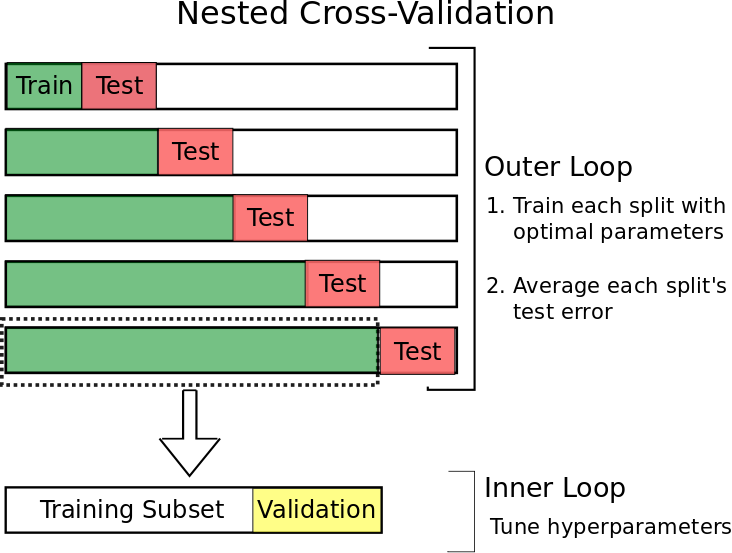

In [9]:
display(Image(filename='TimeValid.png', embed=True))

[Source: Time Series Cross Validation](https://towardsdatascience.com/time-series-nested-cross-validation-76adba623eb9)

In this experiment we will be using a rolling-window as opposed to expanding. Within each training window, we will train the model on the whole subset and tune hyper-parameters via GridSearch by splitting the training set into subsets as below. 

In [10]:
X = np.arange(11)
y = np.arange(11)
tscv = TimeSeriesSplit(n_splits=5)

for train_index, test_index in tscv.split(X):
   print("TRAIN:", train_index, "TEST:", test_index)


TRAIN: [0 1 2 3 4 5] TEST: [6]
TRAIN: [0 1 2 3 4 5 6] TEST: [7]
TRAIN: [0 1 2 3 4 5 6 7] TEST: [8]
TRAIN: [0 1 2 3 4 5 6 7 8] TEST: [9]
TRAIN: [0 1 2 3 4 5 6 7 8 9] TEST: [10]


During our first hyper-parameter tuning iteration, the training set is split into a training subset (index 0 to 5) for each hyper-parameter specified in GridSearch and tested on the validation set (index 6).

## <a name="frm"></a>  Framework 
The following class will be used to test the predictive power of our models. Amongst all models, we will using a expanding window with 3 years worth of data. 

In [11]:
class FX_model(object):
        
    def __init__(self,model,X,Y,w_type='expanding',w_size=10,
                     settings=None,lags=None):
        #Inputs
        self.model = model
        self.X = X
        self.Y = Y
        self.settings = settings
        self.lags = lags
        self.w_type = w_type 
        self.w_size = w_size
        self.train_size = w_size
        self.ccy = X.columns.unique(X.columns.names[1])
        self.hyper_param,self.features,self.early_stopping = None, None, None

        if lags:
            self.X,self.Y = self.add_lags(X,Y,lags)

        if settings: 
            self.hyper_param = settings.get('hyper_param',None)
            self.early_stopping = settings.get('early_stopping',None)
            
            if self.early_stopping:
                self.test_size = round(self.w_size*(1-0.8))
            
            if self.hyper_param:
                self.cv_split = self.hyper_param.get('cv_split',TimeSeriesSplit(2))
                
            self.features = settings.get('features',None)
            
        #Output
        self.forecast_index = self.Y.index.intersection(X.index)[w_size:]
        #Historical predictor
        self.h_predict = pd.DataFrame(index=self.forecast_index)
        self.h_MSE = pd.DataFrame(index=self.forecast_index)
        self.h_cum_RMSE = pd.DataFrame(index=self.forecast_index)
        #Model predictor
        self.m_predict = pd.DataFrame(index=self.forecast_index)
        self.m_MSE = pd.DataFrame(index=self.forecast_index)
        self.m_cum_RMSE = pd.DataFrame(index=self.forecast_index)
        #difference and out-of-sample
        self.d_cum_RMSE = pd.DataFrame(index=self.forecast_index)
        self.r2oos = pd.DataFrame(index=self.forecast_index)
        
        self.model_features = pd.DataFrame(index=self.forecast_index)
        self.best_hparam= pd.DataFrame(index=self.forecast_index)
        
    @staticmethod
    def add_lags(X,Y,lags):
        lagged_df = pd.DataFrame(index=X.index)
        levels = X.columns.names[0]
        
        for lag in lags:
                X_lagged = X.shift(lag)
                xcol = X_lagged.columns.unique(level=levels)+" T-"+str(lag)
                X_lagged.columns = X_lagged.columns.set_levels(xcol,level=levels)
                lagged_df= pd.concat([lagged_df,X_lagged],axis=1,sort=False)
                
                Y_lagged = Y.shift(lag)
                ycol = Y_lagged.columns.unique(level=levels)+" T-"+str(lag)
                Y_lagged.columns = Y_lagged.columns.set_levels(ycol,level=levels)
                lagged_df = pd.concat([lagged_df,Y_lagged],axis=1,sort=False)
        
        
        return pd.concat([X,lagged_df],axis=1,sort=False).dropna(axis=0),Y.iloc[len(lags):]
    
    
    def hyper_tuning(self,x,y):

        optimise = GridSearchCV(self.model,param_grid = self.hyper_param['params']
                                ,n_jobs = -1,
                                cv=self.cv_split,scoring='neg_mean_squared_error')\
                                .fit(x,y)
        
        best_params = optimise.best_params_
        best_model = self.model.set_params(**best_params)
        return best_model,best_params
    
    def predict(self):
        
        for ccy in self.ccy:
            X = self.X.loc[:,(slice(None),ccy)]
            Y = self.Y.loc[:,(slice(None),ccy)]
            
            m_predict,h_predict,model_features,hyper_param = zip(*self.regress(X,Y))
            self.m_predict[ccy],self.h_predict[ccy]= m_predict,h_predict
            self.model_features[ccy],self.best_hparam[ccy] = list(model_features),list(hyper_param)
        
        Y_test = self.Y.xs('FX_diff',axis=1,drop_level=True)
        self.m_MSE = self.m_predict.subtract(Y_test,axis='rows',level=1).dropna()**2
        self.h_MSE = self.h_predict.subtract(Y_test,axis='rows',level=1).dropna()**2
        self.m_cum_RMSE = np.sqrt(self.m_MSE.expanding().mean())
        self.h_cum_RMSE = np.sqrt(self.h_MSE.expanding().mean())
        self.d_cum_RMSE = self.h_cum_RMSE - self.m_cum_RMSE
        
        self.r2oos = 1 - self.m_MSE.sum(axis=0)/self.h_MSE.sum(axis=0)
            
        return self.d_cum_RMSE,self.r2oos
        
    
    def regress(self,X,Y):
        best_hparam = None
        model_features = None
        
        for t in range(len(self.forecast_index)):
            i = 0 if self.w_type =='expanding' else t #expanding window
            
            x_train,y_train = X.iloc[i:self.w_size+t].values,Y.iloc[i:self.w_size+t].values
            x_test = X.iloc[self.w_size+t].values
            
            if self.hyper_param:
                self.model,best_param = self.hyper_tuning(x_train,y_train.ravel())
                best_hparam = [v for k,v in best_param.items()]
            
            if self.early_stopping:
                #split into train and validation
                x_train,x_val,y_train,y_val = train_test_split(x_train,y_train,test_size = self.test_size)
                self.model = self.model.fit(x_train,y_train.ravel(),eval_set =[(x_val,y_val)],**self.early_stopping)
            else:
                self.model = self.model.fit(x_train,y_train.ravel())
            
            model_prediction = self.model.predict(x_test.reshape(1,-1))[0]
            hist_prediction = np.mean(y_train)
            
            if self.features:
                model_features = [getattr(self.model,f) for f in self.features]
            
            yield model_prediction,hist_prediction,model_features,best_hparam
                
            

# <a name="prd"></a>  Predictions
Using the class 'FX_models', we will test a variety of models for all currencies. For illustration purposes, all the charts will show Australian Dollar metrics, along with a summary of R2oos for all currencies. 

In [12]:
ccy= 'AUD'
w_size = 36 # three years
w_type = 'rolling'
lags = [1,2]

## <a name="lin"></a>  Linear Regression

In [13]:
lin_reg =  FX_model(model=LinearRegression(),X=X_set.copy(),Y=Y_set.copy(),w_size=w_size,w_type=w_type,lags=lags)
lin_pred = lin_reg.predict()

In [14]:
prediction_compare = pd.concat([Y_set.loc[:,('FX_diff',ccy)],
                                lin_reg.m_predict[ccy],
                                lin_reg.h_predict[ccy]],axis=1,sort=False)

MSE_compare = pd.concat([lin_reg.m_MSE[ccy],lin_reg.h_MSE[ccy]],axis=1,sort=False)
d_cum_RMSE = lin_pred[0].loc[:,ccy].to_frame()


In [15]:
from plotly import tools

def produce_trace(df,names):
    tracelst =[]
    
    for i,name in enumerate(names):
        trace= go.Scatter(name=name,
                    x=df.index,
                    y=df.iloc[:,i].values,
                    marker= dict(opacity=0.9,line=dict(width=1)))
        tracelst.append(trace)
    
    return tracelst
                
    
def stack_fig(tracelst,sub_title,cols=1):
    fig = tools.make_subplots(len(tracelst),subplot_titles=sub_title,print_grid=False)
    for i,trace in enumerate(tracelst):
        #trace represents a group of lines
        for t in trace:
            fig.append_trace(t,i+1,cols)
            #for a in t:
                #fig.append_trace(a,i+1,cols)
    return fig

fig1 = produce_trace(prediction_compare,['Actual FX_diff','Predicted FX_diff','Historical mean'])
fig2 = produce_trace(MSE_compare,['Predicted MSE','Historical mean MSE'])
fig3 = produce_trace(d_cum_RMSE,['Cumulative RMSE differential'])
sub_title = ['Predictions','Mean Squared Error','Cumulative RMSE differential']
fig = stack_fig(tracelst=[fig1,fig2,fig3],sub_title=sub_title)


fig['layout'].update(height=800, width=1000, title=ccy+" Metrics")
py.offline.iplot(fig, filename='stacked-subplots')

A negative cumulative MSE differential indicates that the historical mean measure has outperformed the linear regression model.


In [16]:
data = [go.Bar(
            x=lin_pred[1].index,
            y=lin_pred[1].values
    )]

layout = go.Layout(title='Out of sample R-squared'+" (Mean = "+str(lin_pred[1].mean().round(3))+")",
                   width = 800,height=400)

bar_ccy = go.Figure(data=data, layout=layout)
py.offline.iplot(bar_ccy, filename='basic-bar')

Out of sample R^2 is mainly negative across all currencies. Could we improve this by introducing regularization? 

## <a name="lass"></a> Lasso Regression


Hyper-parameter λ can be tuned to reduce the variance of our estimator. If λ =0, our predictor reverts back to a linear regression and as λ→ ∞, coefficients get shrunk towards 0. If λ is large enough, all coefficients become equal to zero, and our predictor is essentially the historical mean (assuming we fit using a constant). Is there a middle ground whereby we can improve on a linear regression? 

Here we'll tune lambda using Gridsearch and a time series split of 4-folds. 

In [17]:
cv_split = TimeSeriesSplit(n_splits=4)

settings = {"hyper_param":{"cv_split":cv_split,"params":{"alpha":np.linspace(0.0005,0.002,4)}}}

lasso_reg =  FX_model(model=Lasso(normalize=True),settings = settings, X=X_set.copy(),Y=Y_set.copy(),w_size=w_size,lags=lags,w_type=w_type)#,X=X_set,Y=Y_set) 
lasso_pred = lasso_reg.predict()
lasso_best_hparam = lasso_reg.best_hparam[ccy].apply(pd.Series)

In [18]:
lasso_fig1=produce_trace(lasso_best_hparam,['Best Hyper-parameters'])
lasso_fig2=produce_trace(lasso_pred[0][ccy].to_frame(),['Cumulative RMSE differential'])
lasso_fig = stack_fig(tracelst=[lasso_fig1,lasso_fig2],sub_title=['Tuning λ hyper-parameter',"Cumulative RMSE differential"])
lasso_fig['layout'].update(height=500, width=1000, title=ccy+" Metrics")
py.offline.iplot(lasso_fig, filename='stacked-subplots')

In [19]:
data = [go.Bar(
            x=lasso_pred[1].index,
            y=lasso_pred[1].values
    )]

layout = go.Layout(title='Out of sample R-squared'+" (Mean = "+str(lasso_pred[1].mean().round(3))+")",
                   width = 800,height=400)

bar_ccy = go.Figure(data=data, layout=layout)
py.offline.iplot(bar_ccy, filename='basic-bar')

Lasso regression does indeed improve our predictive power over the historical mean, in-fact it outperforms on the SEK. Overall the average out-of-sample R-squared remains negative. 

## <a name="dec"></a> Decision Tree 

Decision trees are quite intuitive but are prone to over-fitting as the tree will split until each leaf node is 'pure' unless otherwise specified. Here we'll be tuning 'min_leaf_samples' which guarantees a minimum number of samples in a leaf. 

In [20]:
settings = {"hyper_param":{"cv_split":TimeSeriesSplit(n_splits=2),"params":{'min_samples_leaf':[7,10],'max_depth':[5,10]}}}
settings.update({"features":["feature_importances_"]})

tree_reg = FX_model(model=DecisionTreeRegressor(),settings=settings,X=X_set.copy(),Y=Y_set.copy(),w_size=w_size,lags=lags,w_type=w_type)
tree_pred = tree_reg.predict()

tree_best_hparam = tree_reg.best_hparam[ccy].apply(pd.Series)
tree_best_hparam.columns = list(settings["hyper_param"]['params'].keys())

In [21]:
def retrieve_best_f(df,index):
    best_features = pd.DataFrame()
    for ccy in df.columns:
         
        df_temp = df[ccy].apply(lambda x:x[0]).apply(pd.Series)
        best_features[ccy] = df_temp.mean(axis=0)
        
        #best_features = pd.concat([best_features,df_temp.mean(axis=0)],sort=False,axis=1)
    
    best_features = best_features.mean(axis=1)
    best_features.index = index
    best_features.name = 'Average score'
    return best_features.sort_values(ascending=True)

best_features = tree_reg.model_features
best_features = retrieve_best_f(best_features,tree_reg.X.columns.unique('variables'))

In [22]:
data = [go.Bar(
            x=best_features.values,
            y=best_features.index,orientation = 'h',
            marker=dict(
                        color=['rgb'+str(tuple((np.random.choice(range(256), size=3)))) for i in best_features.index])
    )]

layout = go.Layout(title='Average Feature Importance Score',
                   width = 800,height=400)

bar_ccy = go.Figure(data=data, layout=layout)
py.offline.iplot(bar_ccy, filename='horizontal-bar')

The most important feature is the Interest rate differential

In [23]:
tree_fig1=produce_trace(tree_best_hparam,tree_best_hparam.columns)
tree_fig2=produce_trace(tree_pred[0][ccy].to_frame(),['Cumulative RMSE differential'])
tree_fig = stack_fig(tracelst=[tree_fig1,tree_fig2],sub_title=['Hyper_parameter tuning',"Cumulative RMSE differential"])
tree_fig['layout'].update(height=500, width=1000, title=ccy+" Metrics")
py.offline.iplot(tree_fig, filename='stacked-subplots')

In [24]:
data = [go.Bar(
            x=tree_pred[1].index,
            y=tree_pred[1].values
    )]

layout = go.Layout(title='Out of sample R-squared'+" (Mean = "+str(tree_pred[1].mean().round(3))+")",
                   width = 800,height=400)

bar_ccy = go.Figure(data=data, layout=layout)
py.offline.iplot(bar_ccy, filename='basic-bar')

Historical mean outperforms the decision tree. 

# <a name="ens"></a>  Ensemble

Ensemble refers to method of combining a group of predictors to improve predictions. Specifically, there are two techniques that focus on reducing variance (Bagging) and bias (Boosting). 

## <a name="rf"></a> Random Forest (Bagging)
With the random forest we will train a group of decision trees individually, all of which will over-fit the data in a particular way, and combine their predictions on a test set. Here we will create 30 decision trees without any hyper-parameter tuning.

In [25]:
settings = {"features":["feature_importances_"]}

random_reg = FX_model(model=RandomForestRegressor(n_estimators=30),settings =settings, X=X_set.copy(),Y=Y_set.copy(),w_size=w_size,lags=lags,w_type=w_type)#,X=X_set,Y=Y_set) 
random_pred = random_reg.predict()

In [26]:
best_features = retrieve_best_f(random_reg.model_features,random_reg.X.columns.unique('variables'))

In [27]:
data = [go.Bar(
            x=best_features.values,
            y=best_features.index,orientation = 'h',
            marker=dict(
                        color=['rgb'+str(tuple((np.random.choice(range(256), size=3)))) for i in best_features.index])
    )]

layout = go.Layout(title='Average Feature Importance Score',
                   width = 800,height=400)

bar_ccy = go.Figure(data=data, layout=layout)
py.offline.iplot(bar_ccy, filename='horizontal-bar')

CPI differential is now the most important. Money supply is the least important.

In [28]:
random_fig1=produce_trace(tree_pred[0][ccy].to_frame(),['Cumulative RMSE differential'])
random_fig = stack_fig(tracelst=[random_fig1],sub_title=["Cumulative RMSE differential"])
random_fig['layout'].update(height=500, width=1000, title=ccy+" Metrics")
py.offline.iplot(random_fig, filename='stacked-subplots')

In [29]:
data = [go.Bar(
            x=random_pred[1].index,
            y=random_pred[1].values
    )]

layout = go.Layout(title='Out of sample R-squared'+" (Mean = "+str(random_pred[1].mean().round(3))+")",
                   width = 800,height=400)

bar_ccy = go.Figure(data=data, layout=layout)
py.offline.iplot(bar_ccy, filename='basic-bar')

Random forest performs quite well on average. We can perhaps improve scores by tuning hyper-parameters.

## <a name="gbt"></a> Gradient Boosting
With gradient boosting we can sequentially add predictors (in this case trees) to an ensemble, each of which will correct its predecessor. Here we use the package xgboost, along with the early stopping feature. 

In [30]:
#settings = {"hyper_param":{"cv_split":TimeSeriesSplit(n_splits=2),"params":{'min_samples_leaf':np.linspace(1,15,5)}}}
settings = {"early_stopping":{"early_stopping_rounds":3,"eval_metric":'rmse','verbose':False}}
#settings.update({"features":["feature_importances_"]})
boosted_reg = FX_model(model=XGBRegressor(learning_rate=0.1,n_estimators=200),settings =settings, X=X_set.copy(),Y=Y_set.copy(),w_size=w_size,lags=lags,w_type = w_type)#,X=X_set,Y=Y_set) 

boosted_pred = boosted_reg.predict()

In [31]:

boosted_fig1=produce_trace(boosted_pred[0][ccy].to_frame(),['Cumulative RMSE differential'])
boosted_fig = stack_fig(tracelst=[boosted_fig1],sub_title=["Cumulative RMSE differential"])
boosted_fig['layout'].update(height=500, width=1000, title=ccy+" Metrics")
py.offline.iplot(boosted_fig, filename='stacked-subplots')


In [32]:
data = [go.Bar(
            x=boosted_pred[1].index,
            y=boosted_pred[1].values
    )]

layout = go.Layout(title='Out of sample R-squared'+" (Mean = "+str(boosted_pred[1].mean().round(3))+")",
                   width = 800,height=400)

bar_ccy = go.Figure(data=data, layout=layout)
py.offline.iplot(bar_ccy, filename='basic-bar')

## <a name="lstm"></a> LSTM

This type of recurrent neural network requires a different input framework but we shall use the same methodology. An LSTM is built for each window of data and weights are approximately re-initialised across each model. 

In [33]:
def create_batch(X,Y,timestep):
    
    _X,_Y = [],[]
    
    for t in range(X.shape[0]-timestep):
        _X.append(X[t:t+timestep])
        _Y.append(Y[t+timestep]) #is this right?
    return np.array(_X), np.array(_Y)


def LSTM_run(model,X,Y,window,timestep):

    y_pred = []
    y_test = []
    #Get initial weights (default =glorot_uniform)
    initial_weights = model.get_weights()
    
    for t in range(Y.index[window:].shape[0]):
        x_scaler = MinMaxScaler(feature_range=(0,1))
        y_scaler = MinMaxScaler(feature_range=(0,1))
        
        x_train,y_train = x_scaler.fit_transform(X[t:window+t]),y_scaler.fit_transform(Y[t:window+t])
        x_train,y_train = create_batch(x_train,y_train,timestep=timestep)
        
        x_test = np.expand_dims(x_scaler.transform(X.iloc[window-timestep+t:window+t]),axis=0)
        y_test.append(Y.iloc[window+t].values[0])
        
        model.fit(x_train,y_train,epochs=1,batch_size=1,shuffle=False,verbose = 0)

        y_pred.append(y_scaler.inverse_transform(model.predict(x_test))[0][0])
        
        initial_weights = [np.random.permutation(w.flat).reshape(w.shape) for w in initial_weights]
        model.set_weights(initial_weights)
    
        
    return y_pred,y_test

def define_model(timestep,features):
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(timestep,features),stateful=False))
    model.add(Dropout(0.2))
    model.add(LSTM(units=50, return_sequences=False, input_shape=(timestep,features),stateful=False))
    model.add(Dropout(0.2))
    model.add(Dense(units=1,activation='linear'))
    model.compile(optimizer='rmsprop',loss='mean_squared_error')
    return model 
    

In [34]:
X,Y= FX_model.add_lags(X_set,Y_set,lags = [1,2])
cur = X.columns.unique('ccy')
features = len(X.columns.unique('variables'))
window = 36
timestep = 5

forecast_idx = Y.index[window:]
df_LSTM_pred = pd.DataFrame(index = forecast_idx,columns =cur)
df_LSTM_true = pd.DataFrame(index = forecast_idx,columns =cur)

In [35]:
for c in cur:
    X_ccy = X.loc[:,(slice(None),c)]
    Y_ccy = Y.loc[:,(slice(None),c)]
    
    model = define_model(timestep,features)
    y_pred,y_test = LSTM_run(model,X_ccy,Y_ccy,window,timestep)
    df_LSTM_pred[c],df_LSTM_true[c] = y_pred,y_test

In [36]:
df_historical = Y.xs('FX_diff',axis=1,drop_level=True).shift(1).rolling(window).mean().dropna()

m_MSE = (df_LSTM_pred-df_LSTM_true)**2
h_MSE = (df_historical-df_LSTM_true)**2

m_cum_RMSE = np.sqrt(m_MSE.expanding().mean())
h_cum_RMSE = np.sqrt(h_MSE.expanding().mean())
d_cum_RMSE = h_cum_RMSE - m_cum_RMSE
r2oos = 1 - m_MSE.sum(axis=0)/h_MSE.sum(axis=0)

lstm_pred = d_cum_RMSE,r2oos

In [39]:
lstm_fig1=produce_trace(lstm_pred[0][ccy].to_frame(),['Cumulative RMSE differential'])
lstm_fig = stack_fig(tracelst=[lstm_fig1],sub_title=["Cumulative RMSE differential"])
lstm_fig['layout'].update(height=500, width=1000, title=ccy+" Metrics")
py.offline.iplot(lstm_fig, filename='stacked-subplots')

In [40]:
data = [go.Bar(
            x=lstm_pred[1].index,
            y=lstm_pred[1].values
    )]

layout = go.Layout(title='Out of sample R-squared'+" (Mean = "+str(lstm_pred[1].mean().round(3))+")",
                   width = 800,height=400)

bar_ccy = go.Figure(data=data, layout=layout)
py.offline.iplot(bar_ccy, filename='basic-bar')

During the initial stages, LSTM performs quite poorly due to the nature of weight learning via backpropgation through time. We could improve predictions by increasing epoch along with early stopping.

# <a name="sum"></a> Summary
Here we will compare the performance of all models by averaging D-cumulative RMSE and R2oos across all currencies.

In [42]:
model_list = [lin_pred,lasso_pred,tree_pred,random_pred,boosted_pred,lstm_pred]
titles = ['Linear Regression','Lasso Regression','Decision Tree','Random Forest','xgboost','LSTM']
avg_dcum_RMSE = pd.concat([model[0].mean(axis=1).rename(n) for n,model in zip(titles,model_list)],axis=1,sort=False)
avg_r2oos = pd.Series([model[1].mean().round(3) for model in model_list],index=titles)

In [43]:
figure = avg_dcum_RMSE.iplot(kind='scatter',asFigure=True)

figure['layout']['yaxis1'].update({'title':'Cumulative RMSE'})
#figure['layout'].update({'plot_bgcolor':'rgba(248, 248, 248, 1)'})

figure['layout'].update(dict(title='Cumulative RMSE Differential: Model vs Historical mean '))
    
py.offline.iplot(figure, filename='cufflinks/customized-chart')


In [44]:
avg_r2oos = avg_r2oos.sort_values(ascending=False)

data = [go.Bar(
            x=avg_r2oos.index,
            y=avg_r2oos.values
    )]

layout = go.Layout(title='Average Out-of-sample R-squared',
                   width = 1000,height=400)

bar_ccy = go.Figure(data=data, layout=layout)
py.offline.iplot(bar_ccy, filename='basic-bar')

A positive out-of-sample R-squared indicates that the model has outperformed the historical mean. In this case, all models have not outperformed. The best performing model was the Lasso regression which outperformed the historical mean when predicting the Swedish Krona (SEK). 